# Analysing calibration tests

In [1]:
import sys 
import os

#path_code = os.path.dirname(__file__)

#important to import file that are not here
#sys.path.append(os.path.abspath(path_code))

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tkinter import filedialog, Tk
from processing.processing_functions import temporal_mean_filter, save_imgs, temporal_median_filter, open_images, binarize_imgs, correct_background, select_ROI, invert_imgs, mask_ROIs
from analysis.Analyse_results_with_connected_components import Measure
from skimage import io
#from analysis.Select_ROI import execute_roi
#from AcquireAndSave import execute_capture
#from AcquireAndDisplay import execute_focus


In [2]:
## OPENING FILES
ORIGINAL_FOLDER = os.path.dirname(os.path.realpath('run_processing_analysis.py'))
print('THIS IS ORIGINAL FOLDER PATH', str(ORIGINAL_FOLDER))
IMG_FOLDER = os.path.join('images') #Folder where the images taken by the camera to be processed will be located
IMG_PROCESSED_FOLDER = os.path.abspath('images_processed')  #Folder where the resulting images will be located


# 1. Select folder with images
root = Tk()
root.withdraw()
IMG_PATH = os.path.abspath(filedialog.askdirectory( title='Select Folder with images to be analyzed', initialdir = IMG_FOLDER))
print('\n Files to be processed in ', IMG_PATH)
NAME_IMG_FOLDER = os.path.basename(IMG_PATH)

# 2. Select image to use for placing the ROIs
root = Tk()
root.withdraw()
ROI_PATH = os.path.abspath(filedialog.askopenfilename(title='Select image to place ROI ', initialdir = IMG_PATH))
print('\n Selected image to place ROI ', ROI_PATH)


# 3. Loading images in directory folder
imgs, time_creation = open_images(IMG_PATH)
print('Shape imgs', np.shape(imgs))
framerate = np.mean(np.diff(time_creation))
os.chdir(ORIGINAL_FOLDER)

#%%



THIS IS ORIGINAL FOLDER PATH C:\Users\Administrator\Documents\SENSUS\CODE\SensUs_2021_Code

 Files to be processed in  C:\Users\Administrator\Documents\SENSUS\CODE\SensUs_2021_Code\images\20210830_10ng_5

 Selected image to place ROI  C:\Users\Administrator\Documents\SENSUS\CODE\SensUs_2021_Code\images\20210830_10ng_5\20210830_10ng_5-08312021035159-132.tiff

 Opening images C:\Users\Administrator\Documents\SENSUS\CODE\SensUs_2021_Code\images\20210830_10ng_5 ...
Shape imgs (433, 3648, 5472)


C:\Users\Administrator\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Administrator\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


## MEDIAN FILTER and Processing

In [3]:
## PRE-PROCESSING IMAGES
print('Original images shape: ', np.shape(imgs))

# 1. Temporal average filter: to remove moving objects
imgs_avg = temporal_median_filter(imgs, 4)
print('Averaged images shape: ', np.shape(imgs_avg))
#imgs_median = temporal_median_filter(imgs, 5)
#%%



Original images shape:  (433, 3648, 5472)

 Computing temporal median filter with kernel size  4 ...
Could not compute window with indices 436 to 439
Could not compute window with indices 440 to 443
Could not compute window with indices 444 to 447
Could not compute window with indices 448 to 451
Could not compute window with indices 452 to 455
Could not compute window with indices 456 to 459
Could not compute window with indices 460 to 463
Could not compute window with indices 464 to 467
Could not compute window with indices 468 to 471
Could not compute window with indices 472 to 475
Could not compute window with indices 476 to 479
Could not compute window with indices 480 to 483
Could not compute window with indices 484 to 487
Could not compute window with indices 488 to 491
Could not compute window with indices 492 to 495
Could not compute window with indices 496 to 499
Could not compute window with indices 500 to 503
Could not compute window with indices 504 to 507
Could not compute

Correcting background illumination intensity...
Corrected images shape:  (3648, 5472)
Inverting images...
Binarizing images...
Thresholded images shape:  (109, 3648, 5472)


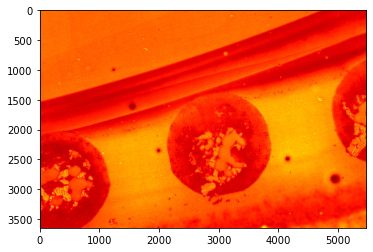

In [4]:
plt.imshow(imgs_avg[10], cmap='jet')
# 2. Background illumination intensity correction
#dark_bright_path = 'Users\Administrator\Desktop\SENSUS\CODE\SensUs_2021_Code-main'
imgs_corrected = correct_background(imgs_avg, ORIGINAL_FOLDER)  #TODO: WARNING IMGS_AVG
print('Corrected images shape: ', np.shape(imgs_corrected[0]))
#%%
plt.imshow(imgs_corrected[10], cmap='jet')
# 3. Inverting image (our AU-NP spots will be white ~255)
imgs_inv = invert_imgs(imgs_corrected)
#print('Inverted images shape: ', np.shape(imgs_inv))
#%%
plt.imshow(imgs_inv[10], cmap='jet')
# 4. Binarizing images: we will have a binary image based on a threshold
rets, imgs_thresh = binarize_imgs(imgs_inv, tr = 130)   #TODO: FIND THRESHOLD
print('Thresholded images shape: ', np.shape(imgs_thresh))

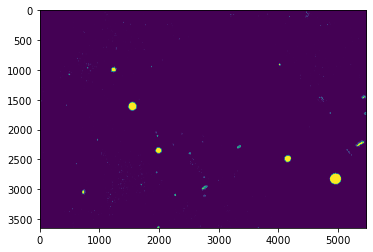

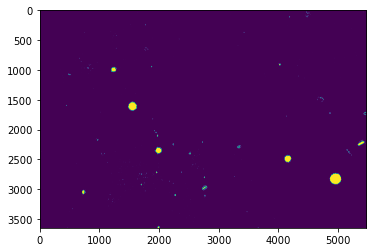

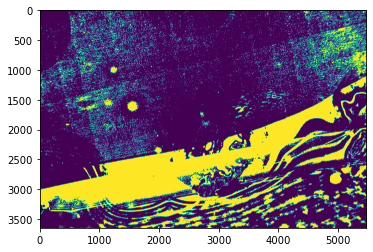

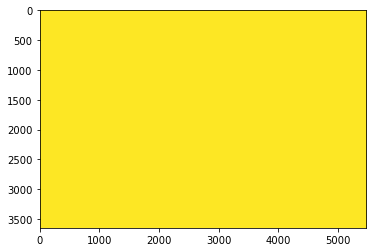

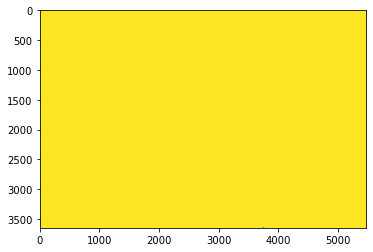

...

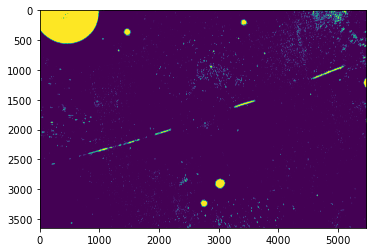

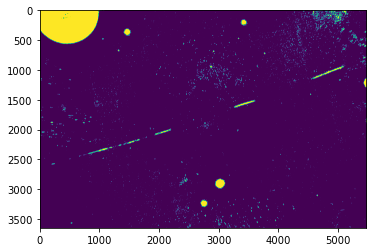

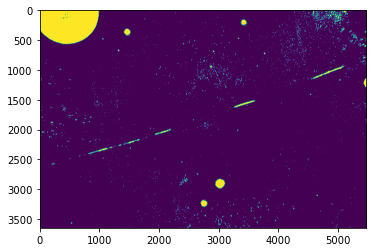

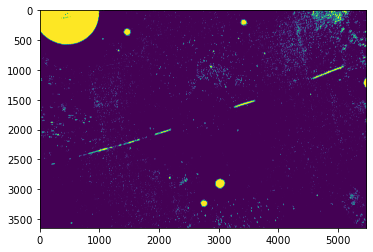

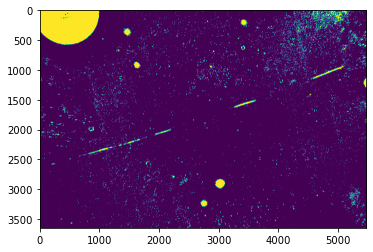

In [5]:
for i in range(len(imgs_avg)):
    plt.imshow(imgs_thresh[i])
    plt.show()

## Testing Threshold

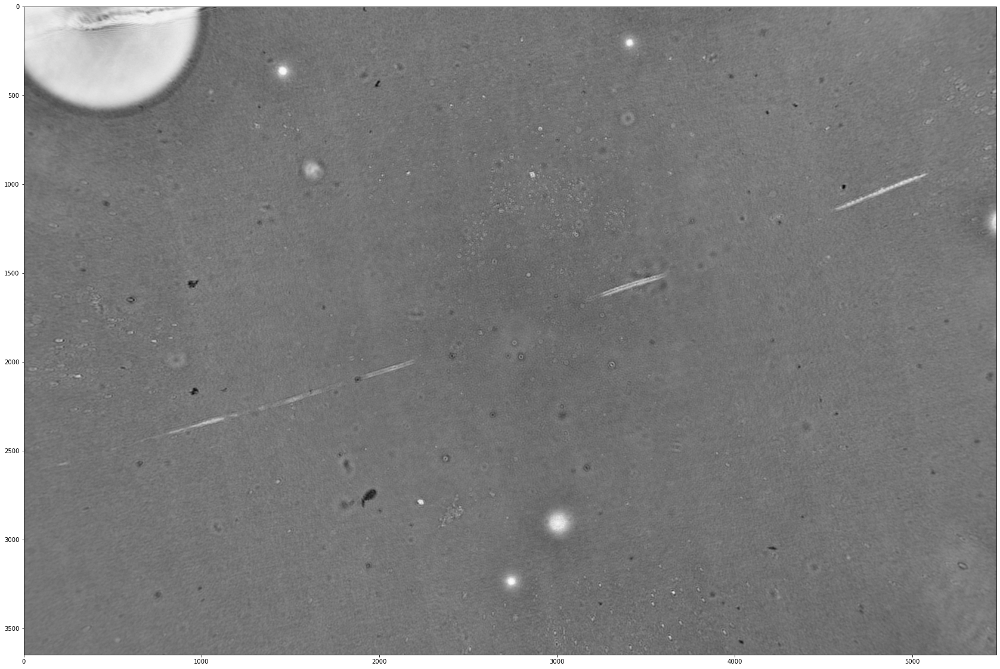

Binarizing images...


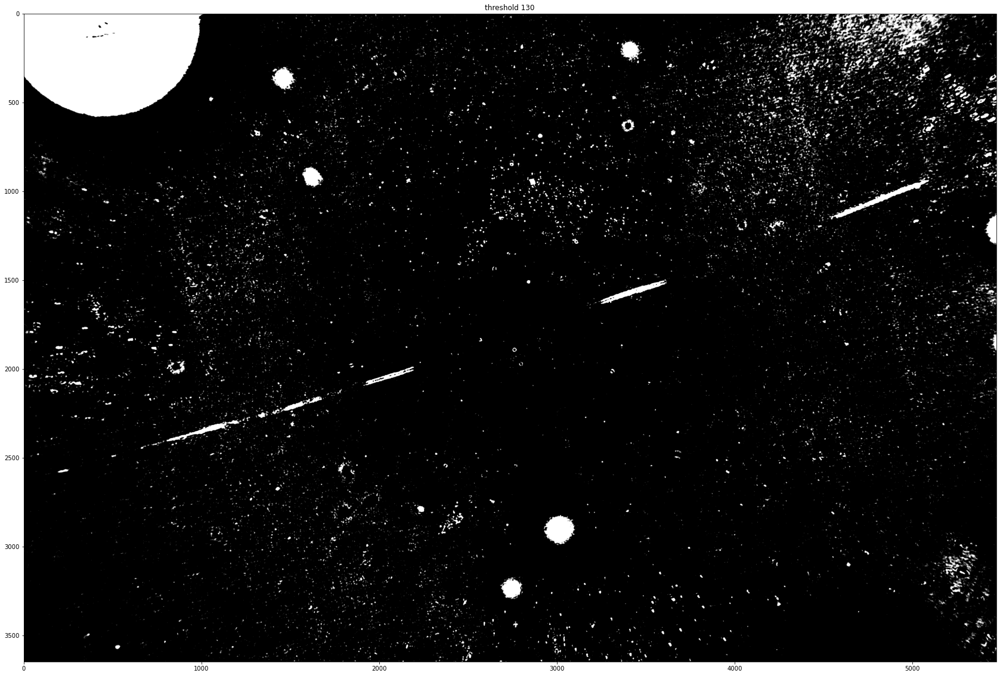

Binarizing images...


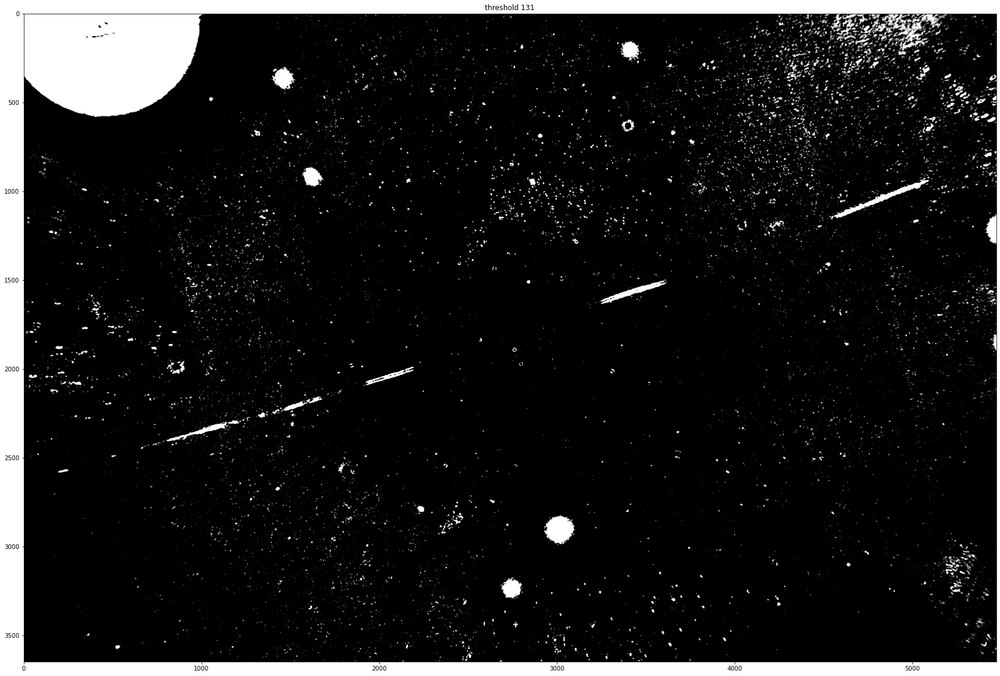

Binarizing images...


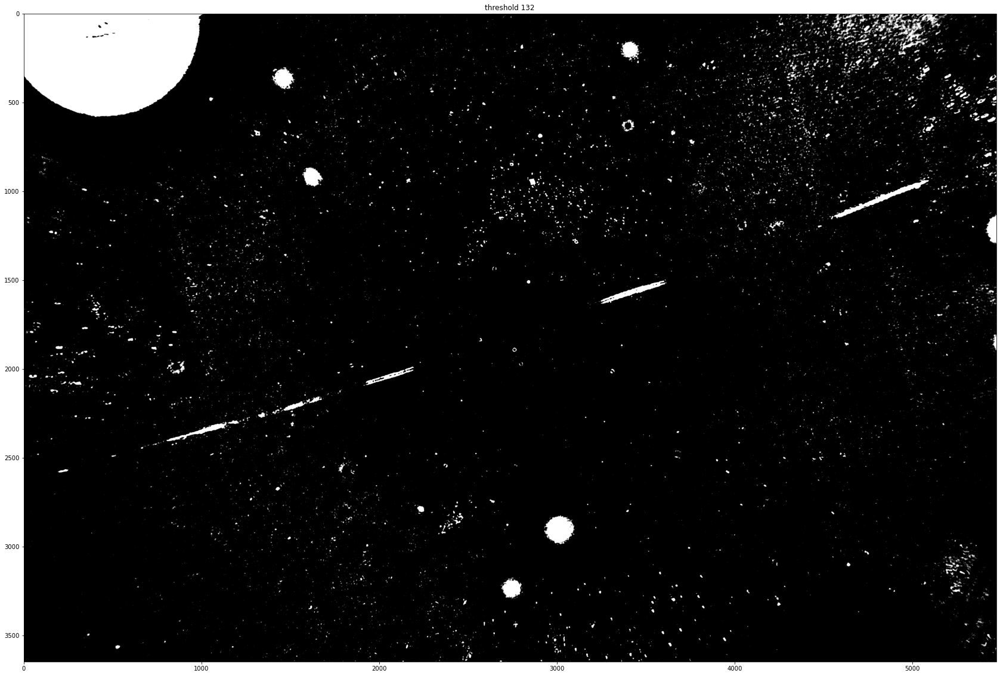

Binarizing images...


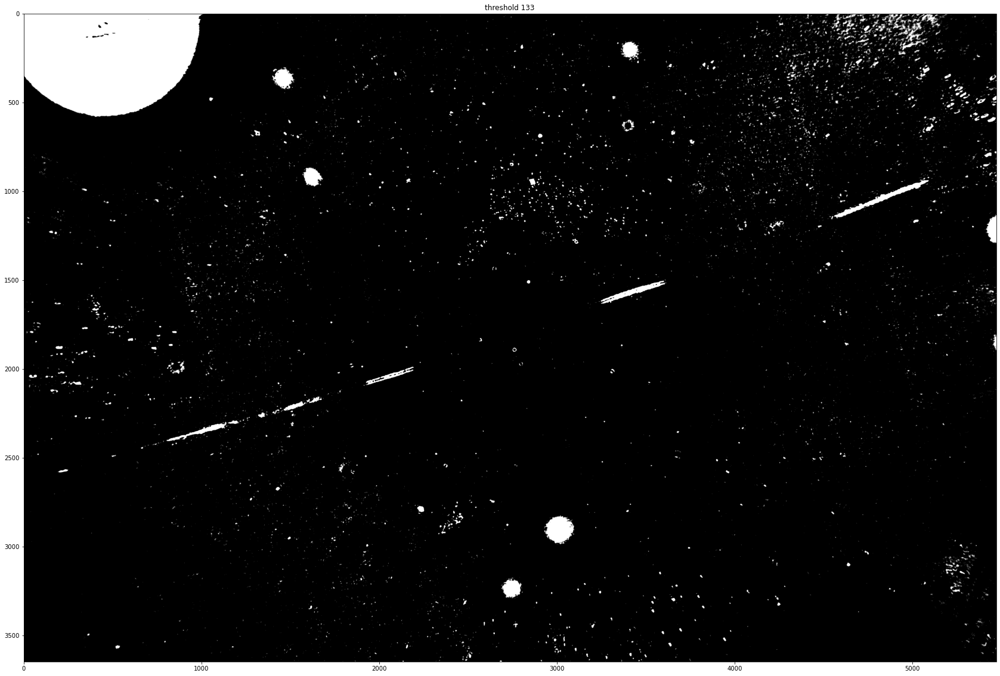

Binarizing images...


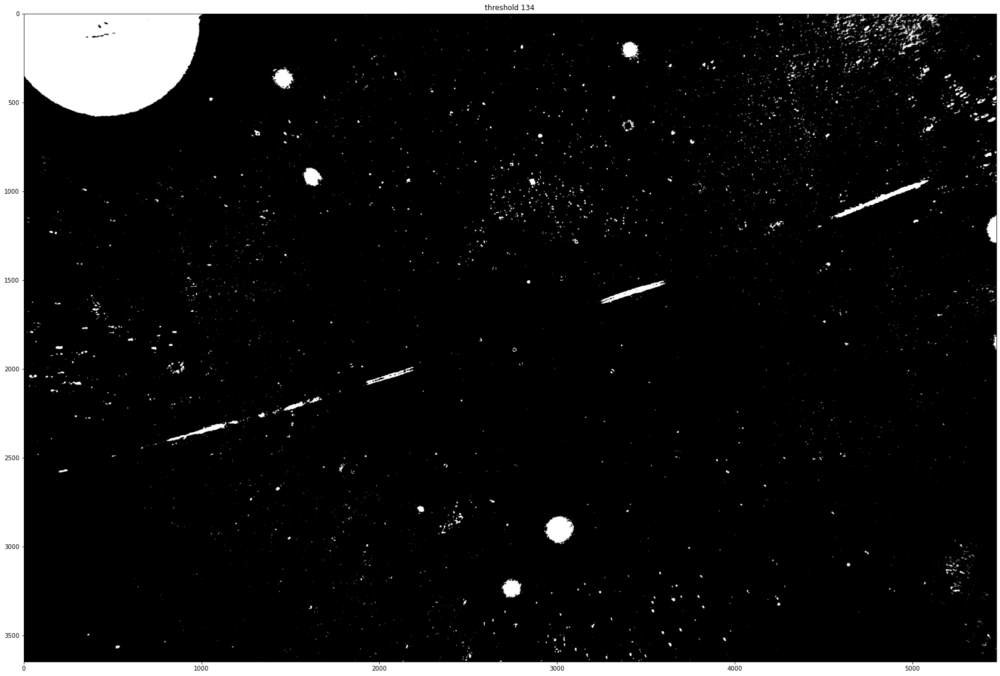

Binarizing images...


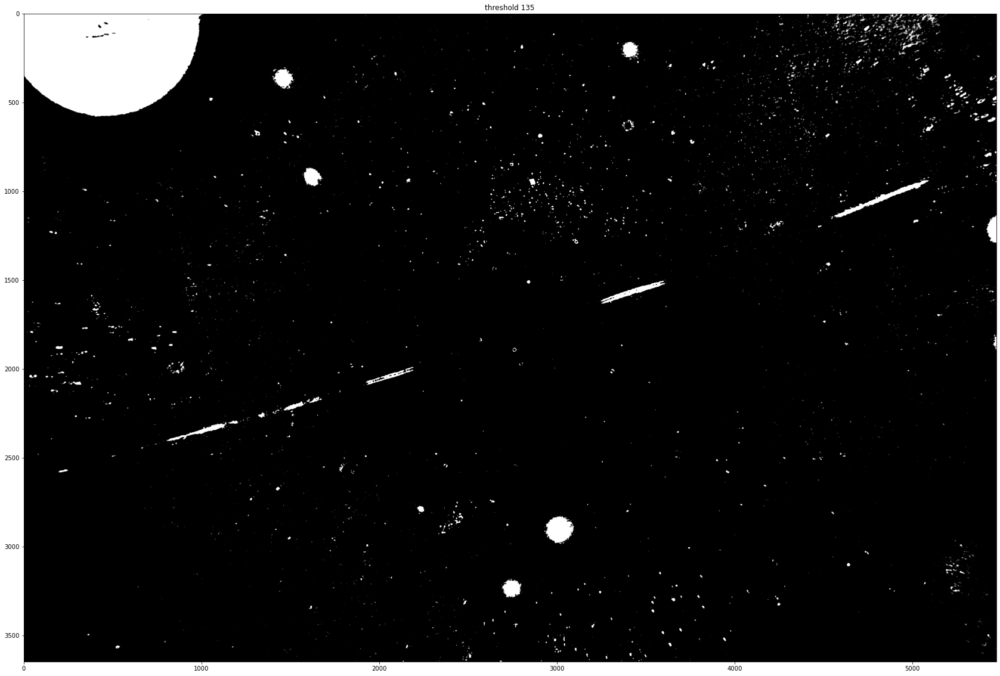

Binarizing images...


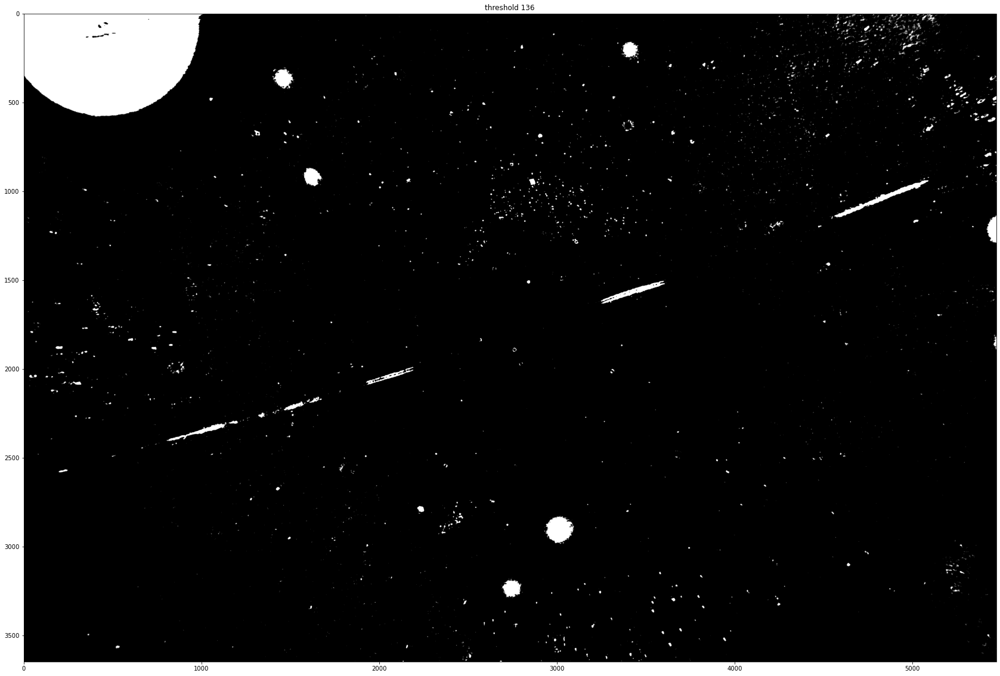

Binarizing images...


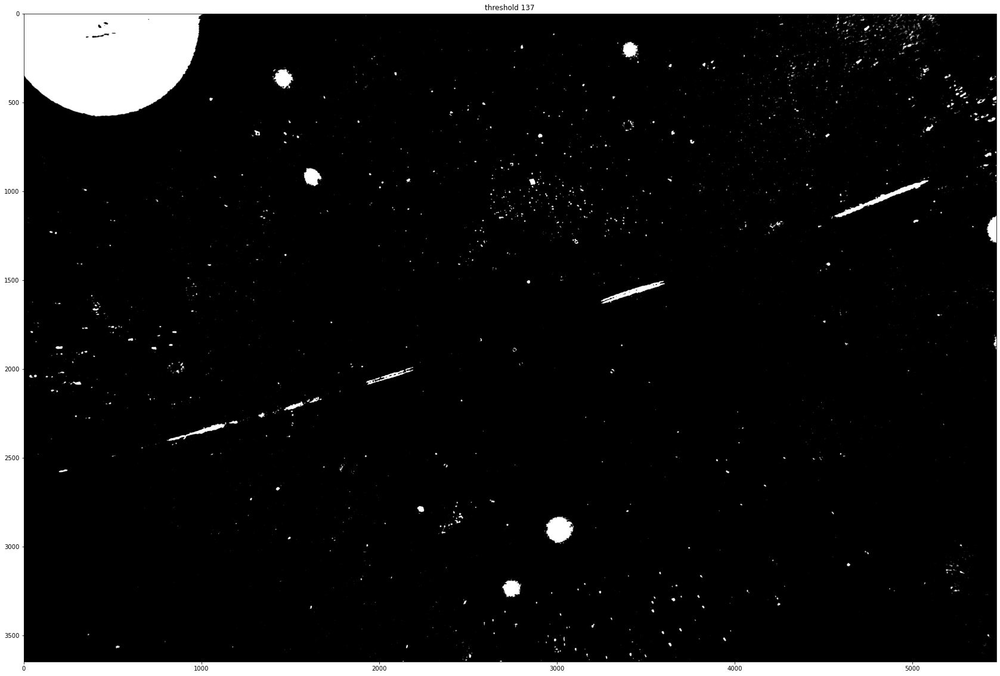

Binarizing images...


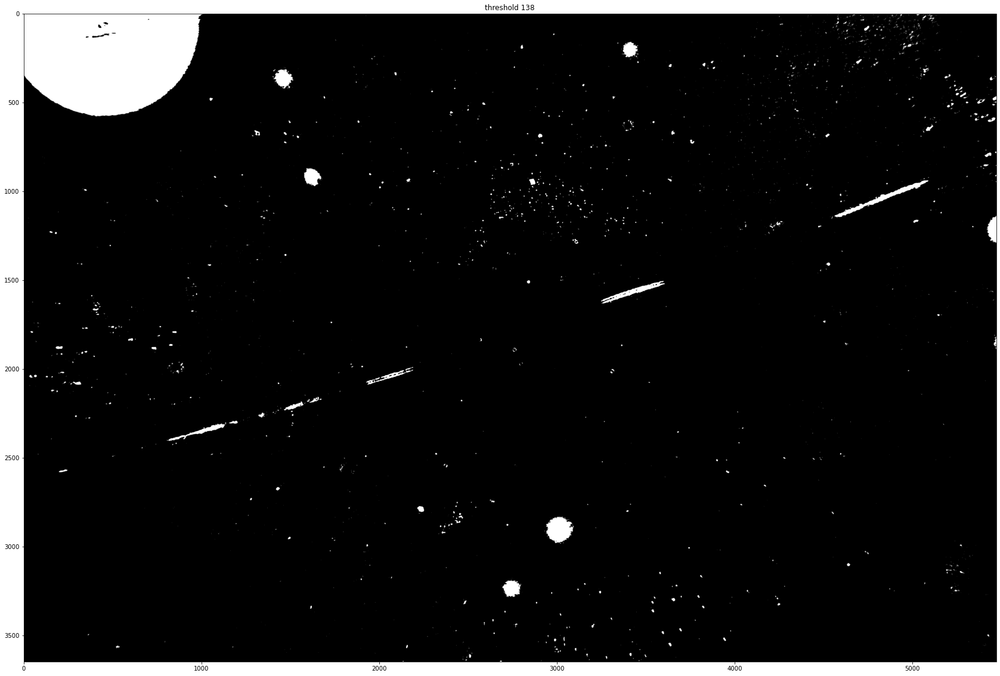

Binarizing images...


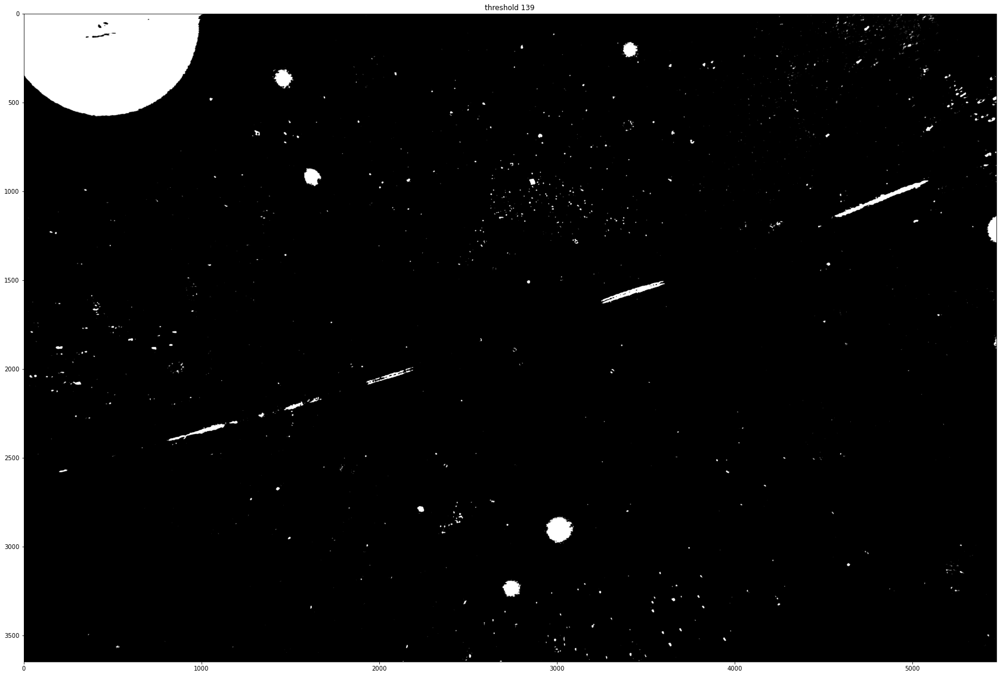

Binarizing images...


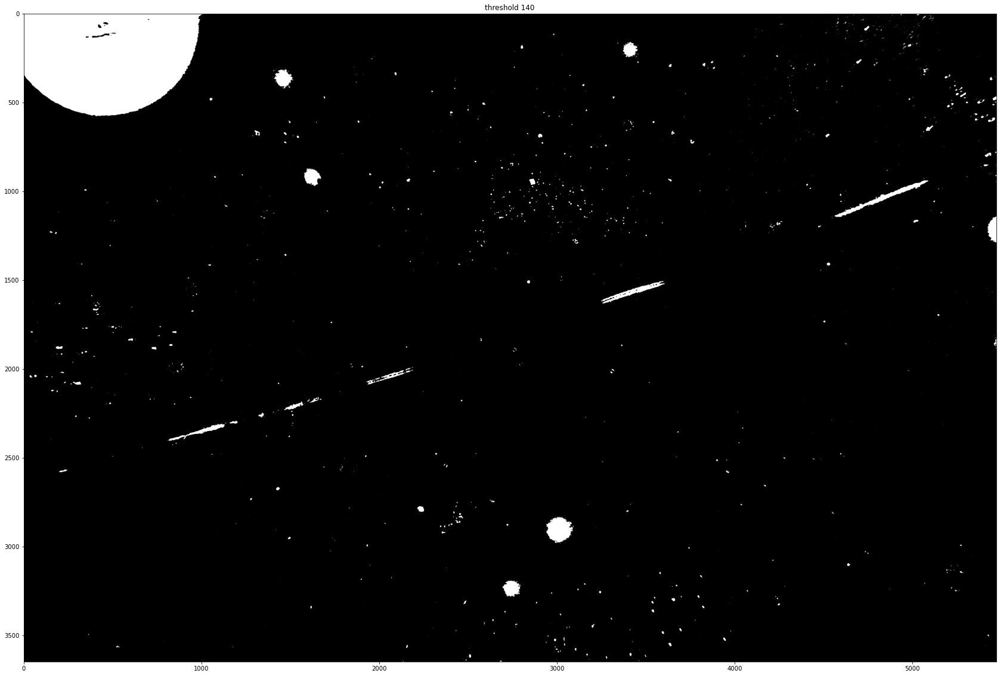

Binarizing images...


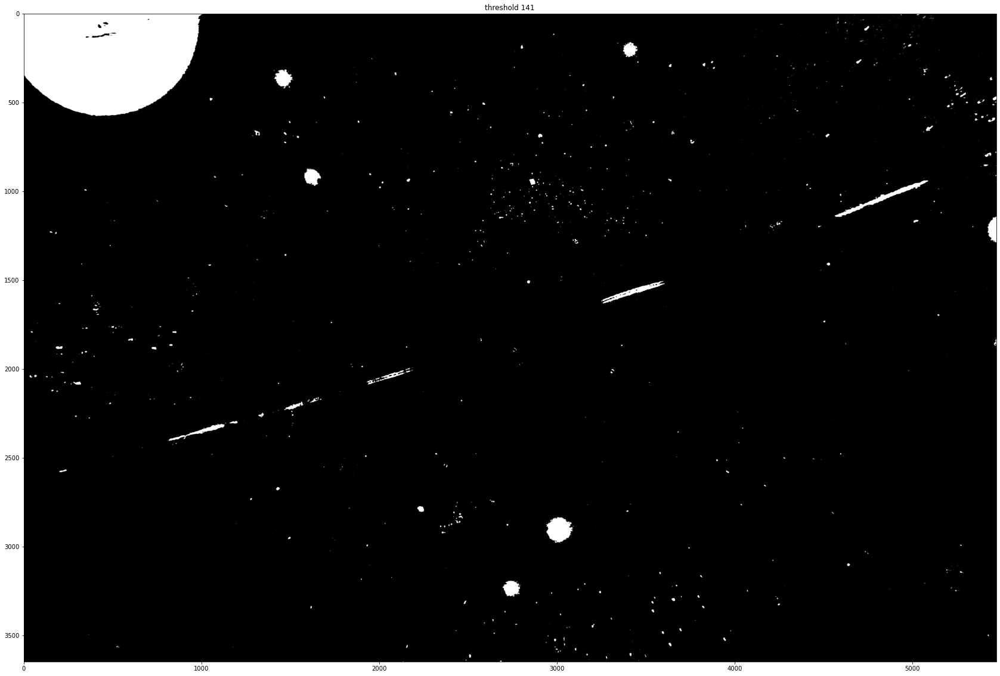

Binarizing images...


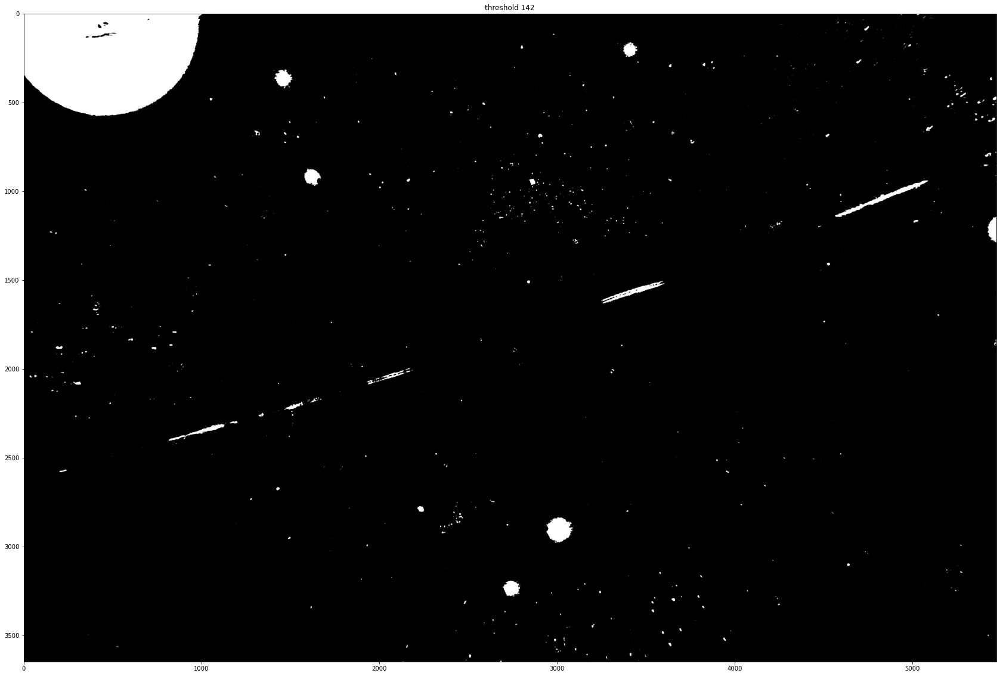

Binarizing images...


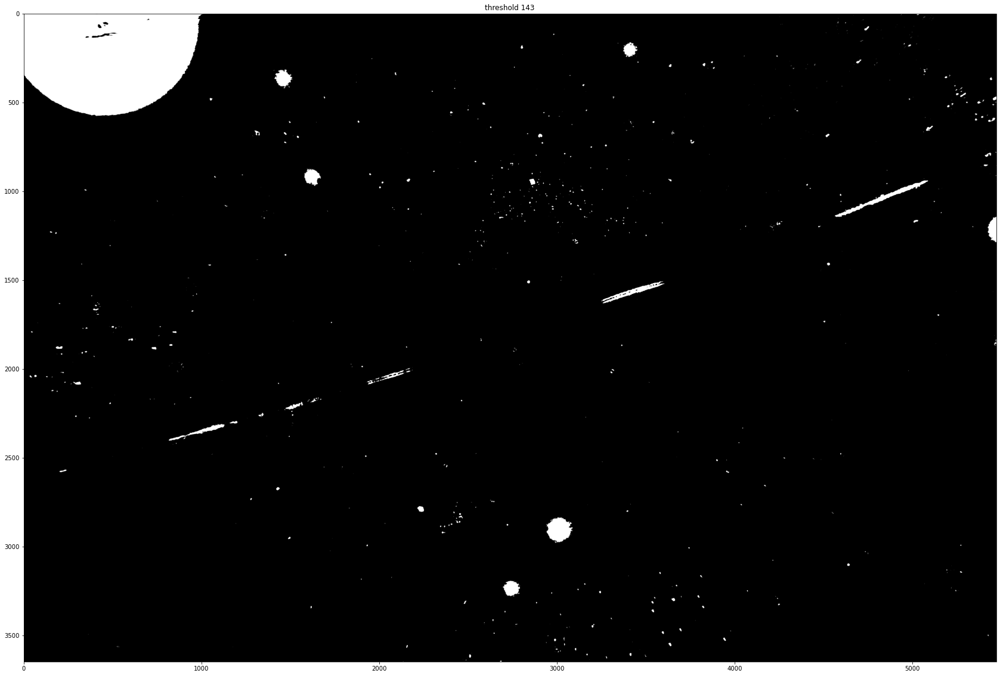

Binarizing images...


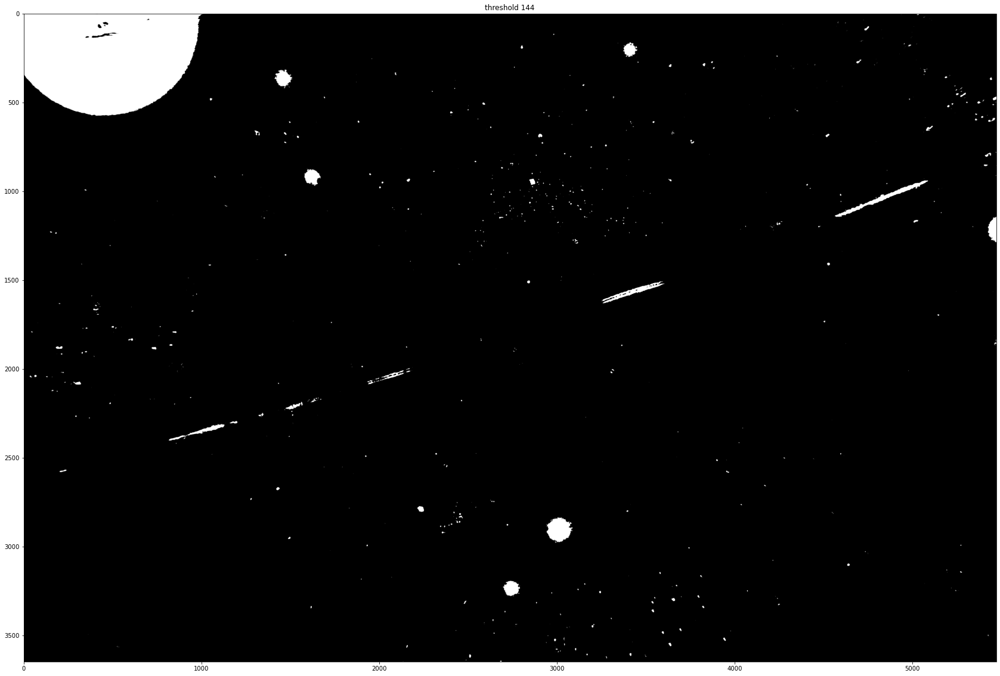

Binarizing images...


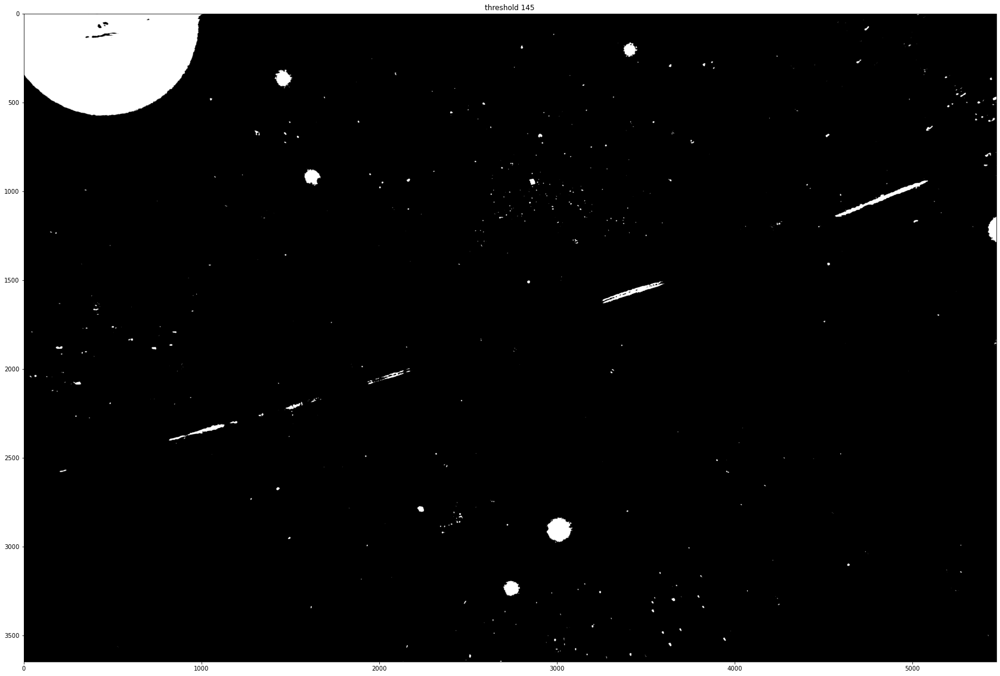

Binarizing images...


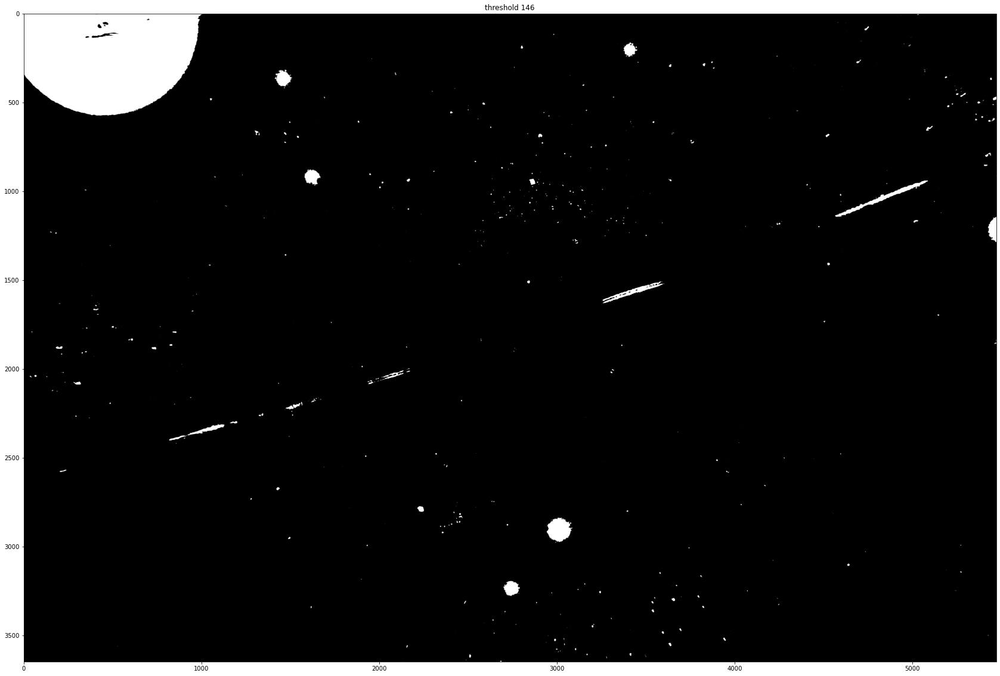

Binarizing images...


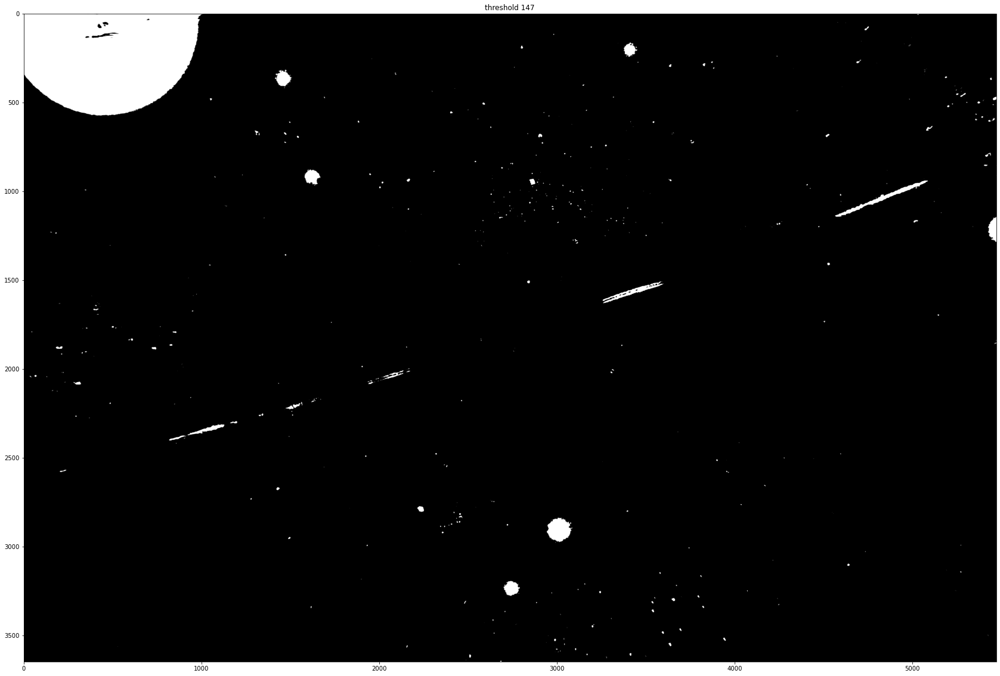

Binarizing images...


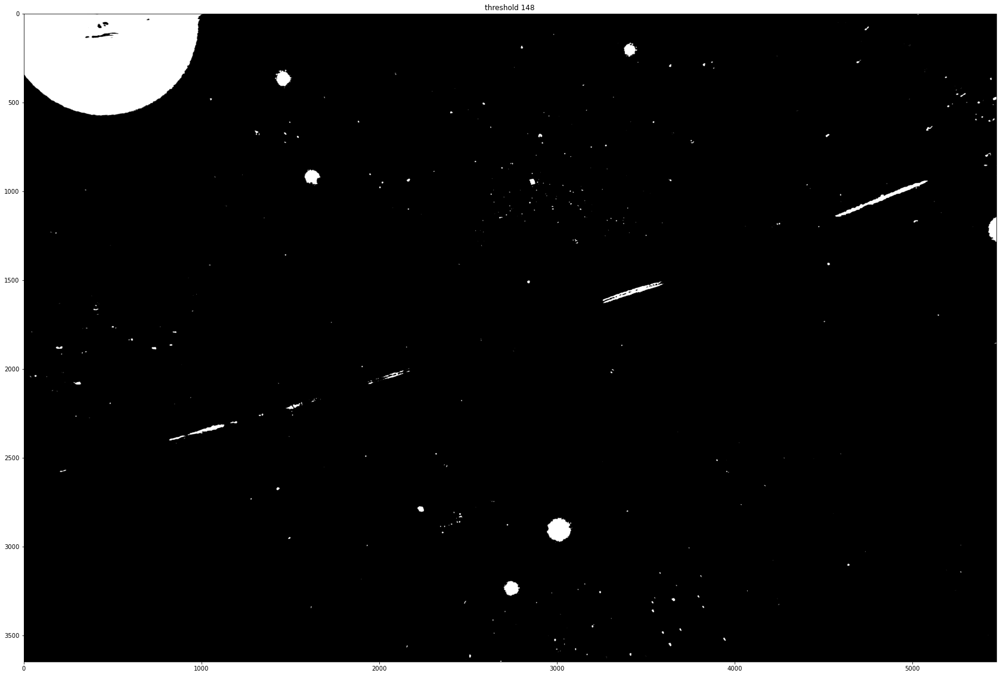

Binarizing images...


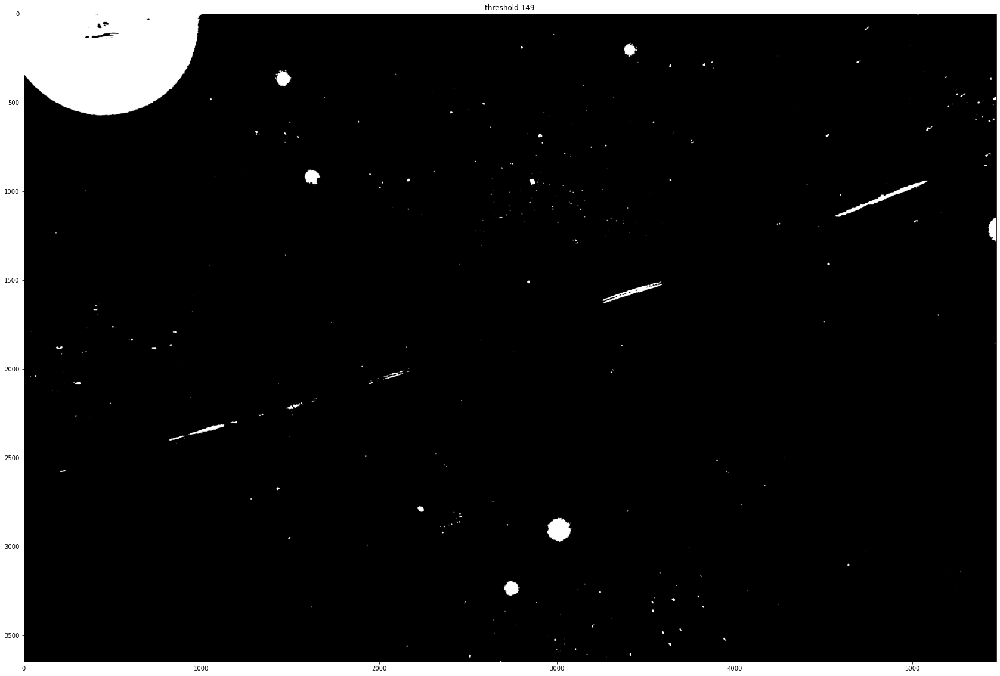

Binarizing images...


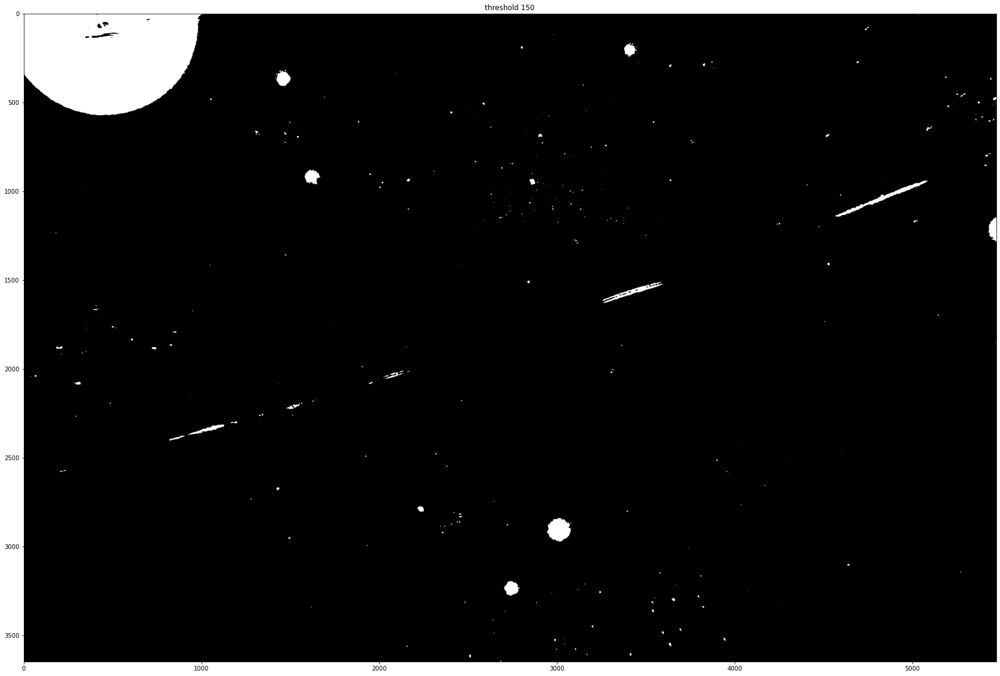

Binarizing images...


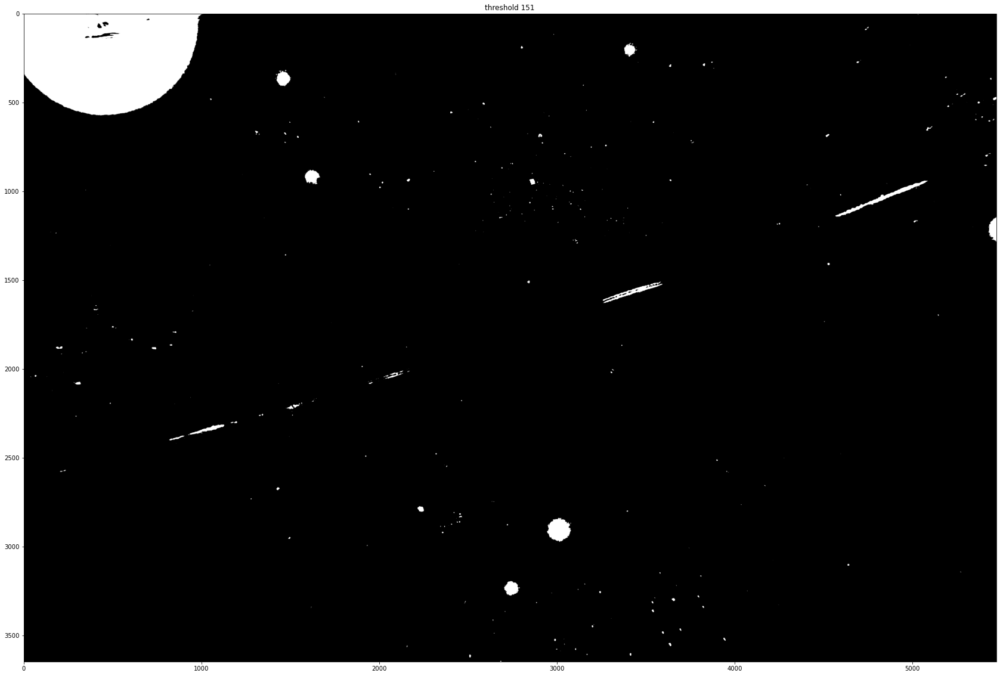

Binarizing images...


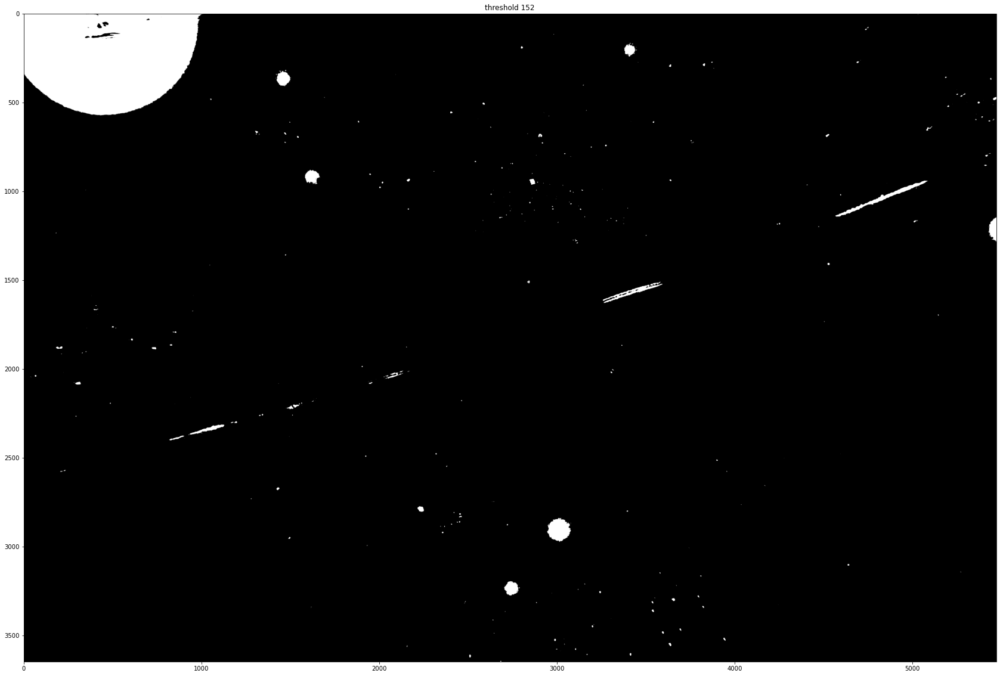

Binarizing images...


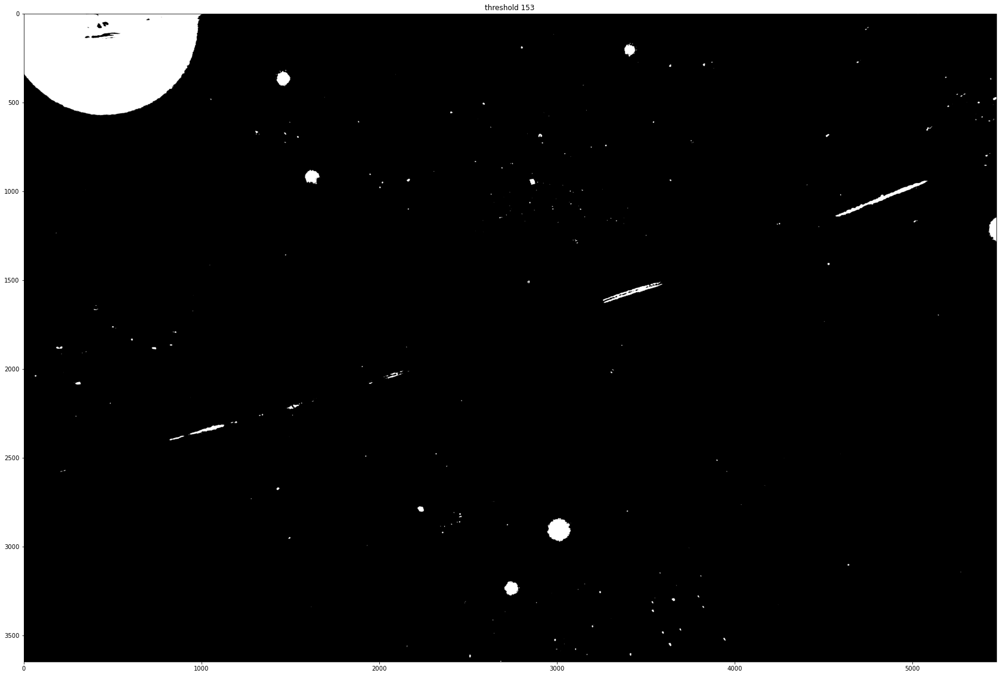

Binarizing images...


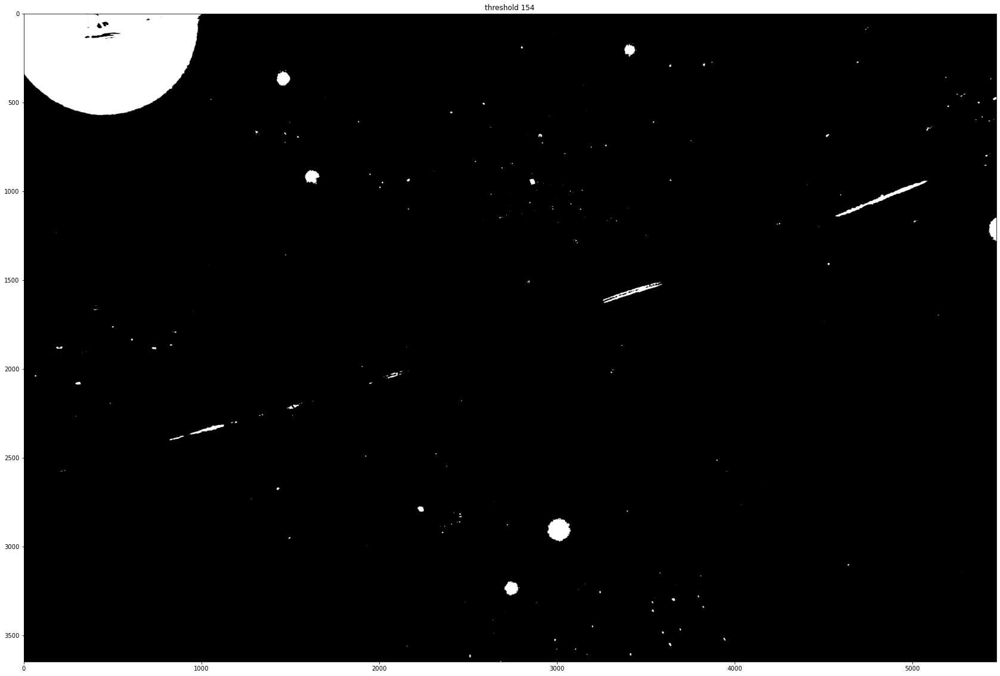

In [6]:
img_test = [imgs_inv[-1]]

plt.figure(figsize=(30,20))
plt.imshow(img_test[0], cmap='gray')
plt.show()

for t in range(130,155):
    rets, img_thresh = binarize_imgs(img_test, tr=t)
    plt.figure(figsize=(30,20))
    plt.imshow(img_thresh[0], cmap='gray')
    plt.title('threshold '+str(t))
    plt.show()

In [7]:
# 4. Binarizing images: we will have a binary image based on a threshold
axes = []
f1 = plt.figure()
f_signal = []
f_background = []
f_foreground = []
for t in range(120,140):
    #fig=plt.figure(figsize=(18, 16))
    rets, imgs_thresh = binarize_imgs(imgs_inv, tr = t)
    #print('Thresholded images shape: ', np.shape(imgs_thresh))
    print("threshold = " + str(t))
    
    signal = [] #np.zeros(3)
    foreground = []
    background = []
    capture_refresh_time = framerate  # TODO

    mes = Measure(NAME_IMG_FOLDER, ROIs, capture_refresh_time)
    results = []
    for img in imgs_thresh:
        result = mes.signal_perImage(img)
        #results.append(result)
        signal.append(result[0])
        foreground.append(result[1])
        background.append(result[2])
        #print('final signal', signal)
    f_signal.append(signal)
    f_foreground.append(foreground)
    f_background.append(background)


    
#    for s in range(5):
#        b = imgs_thresh[-s]
#        axes.append( fig.add_subplot(1, 5, s+1) )
#        subplot_title=("Subplot_"+str(s))
#        axes[-1].set_title(subplot_title)  
#        plt.imshow(b)
    #fig.tight_layout()    
#    plt.show()

Binarizing images...
threshold = 120


NameError: name 'ROIs' is not defined

<Figure size 432x288 with 0 Axes>

In [ ]:

    #ROI 1 (OLD)
time = np.arange(0, len(signal)*10,10)
plott = f_background
plott2 = f_signal
for line in plott2:
        plt.plot(time, np.array(line))
#plt.plot(time, np.asarray(f_signal[:10]))

plt.legend(["tr1", "tr2", "tr3", "tr4", "tr5"])
plt.show()

## Results

### SELECT ROI 1

In [8]:
## SELECT ROI
ROIs = select_ROI(ROI_PATH) 

Select the ROI. Press right button if you want to delete. The last 2 ROIs will be used as background. Press 'q' when you have finished. 
ROIs:
 [[2472 1188  200]
 [2832 1288  200]
 [3176  996  200]
 [2784  856  200]
 [2336  756  200]
 [5148 1740  200]
 [1336 3108  200]]


In [9]:
signal = [] #np.zeros(3)
foreground = []
background = []
capture_refresh_time = framerate  # TODO

mes = Measure(NAME_IMG_FOLDER, ROIs, capture_refresh_time)
results = []
for img in imgs_thresh:
    result = mes.signal_perImage(img)
    results.append(result)
    signal.append(result[0])
    foreground = result[1]
    background = result[2]
    print('final signal', signal)
 
    

C:\Users\Administrator\Documents\SENSUS\CODE\SensUs_2021_Code\analysis\Analyse_results_with_connected_components.py:73: FutureWarning: `draw.circle` is deprecated in favor of `draw.disk`.`draw.circle` will be removed in version 0.19
  xvec, yvec = circle(cx, cy, rad)  #TODO: change to disk


Percentage of pixels detected in each ROI (0-1) [0.0, 0.0, 0.0, 0.0, 0.0, 8.757334267448988e-05, 0.10028739978823173]
Percentage of pixels corresponding to Background (0-1) 0.05018748656545311
Percentage of pixels corresponding to Foreground (0-1) 0.0
Percentage of pixels corresponding to Signal -0.05018748656545311
final signal [-0.05018748656545311]
Percentage of pixels detected in each ROI (0-1) [0.0, 0.0, 0.0, 0.0, 0.0013772898438806137, 0.0, 0.11357466423584298]
Percentage of pixels corresponding to Background (0-1) 0.05678733211792149
Percentage of pixels corresponding to Foreground (0-1) 0.00027545796877612275
Percentage of pixels corresponding to Signal -0.056511874149145366
final signal [-0.05018748656545311, -0.056511874149145366]
Percentage of pixels detected in each ROI (0-1) [0.36017323599423606, 0.22662388841563902, 0.2512558813460819, 0.343534300886083, 0.4218567140889586, 0.1720816183553726, 0.022585961197047984]
Percentage of pixels corresponding to Background (0-1) 0.

Percentage of pixels detected in each ROI (0-1) [0.001114569815857144, 0.06556058881131129, 0.0, 0.0, 0.000835927361892858, 0.04604765582084086, 0.3039352275712728]
Percentage of pixels corresponding to Background (0-1) 0.17499144169605682
Percentage of pixels corresponding to Foreground (0-1) 0.013502217197812258
Percentage of pixels corresponding to Signal -0.16148922449824457
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457]
Percentage of pixels detected in each ROI (0-1) [0.02325470308656227, 0.0, 0.048714662165927604, 0.0, 0.0, 0.1289079604168491, 0.06210542238215414]
Percentage of pixels corresponding to Background (0-1) 0.09550669139950162
Percentage of pixels corresponding to Foreground (0-1) 0.014393873050497974
Percentage of pi

Percentage of pixels detected in each ROI (0-1) [0.15350810849541036, 0.40258261748760044, 0.13877986450015525, 0.3706501922632932, 0.008263739063283681, 0.0, 0.4094372218551218]
Percentage of pixels corresponding to Background (0-1) 0.2047186109275609
Percentage of pixels corresponding to Foreground (0-1) 0.21475690436194855
Percentage of pixels corresponding to Signal 0.01003829343438764
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764]
Percentage of pixels detected in each ROI (0-1) [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

Percentage of pixels detected in each ROI (0-1) [0.0, 0.0, 0.0, 0.0159781544316092, 0.0, 0.01550048165338471, 0.0003423321577275514]
Percentage of pixels corresponding to Background (0-1) 0.00792140690555613
Percentage of pixels corresponding to Foreground (0-1) 0.0031956308863218402
Percentage of pixels corresponding to Signal -0.0047257760192342905
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.7514668534897975e-05, 0.0, 0.0, -0.24507957232363922, 0.2055847908

Percentage of pixels detected in each ROI (0-1) [0.0011464146677387767, 0.0, 0.004506046541251025, 0.01136065090877246, 0.00021495275020102063, 0.003574584623713269, 0.002420208743004084]
Percentage of pixels corresponding to Background (0-1) 0.0029973966833586763
Percentage of pixels corresponding to Foreground (0-1) 0.0034456129735926564
Percentage of pixels corresponding to Signal 0.00044821629023398006
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.751466853

Percentage of pixels corresponding to Signal -0.20734660732909269
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.7514668534897975e-05, 0.0, 0.0, -0.24507957232363922, 0.20558479089874135, -0.0047257760192342905, 0.001842224681352451, 0.0009991322277862252, -0.008384749500433872, -0.1894537811781003, -0.15944319276484964, -0.17274399127451057, 0.2020786727065736, 0.00044821629023398006, 0.0005907220024042865, 0.0016710586024886753, -0.006873711278650416, -0.14978

Percentage of pixels detected in each ROI (0-1) [0.021240516205049, 0.013175807466025523, 0.06213726723403578, 0.08766091601716437, 0.07821891743426028, 0.6048929614916129, 0.035124871625440854]
Percentage of pixels corresponding to Background (0-1) 0.32000891655852687
Percentage of pixels corresponding to Foreground (0-1) 0.05248668487130699
Percentage of pixels corresponding to Signal -0.2675222316872199
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.751466853

Percentage of pixels detected in each ROI (0-1) [0.008470730600514294, 0.007507423831094906, 0.012873281373150013, 0.020691192510090838, 0.003932839207381637, 0.007587035960798987, 0.007061595904752048]
Percentage of pixels corresponding to Background (0-1) 0.007324315932775518
Percentage of pixels corresponding to Foreground (0-1) 0.010695093504446338
Percentage of pixels corresponding to Signal 0.00337077757167082
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1

Percentage of pixels detected in each ROI (0-1) [0.004060218614908168, 0.004275171365109188, 0.012921048650972463, 0.019512932990470428, 0.0031526403362816357, 0.03791925737805412, 0.015564171357147974]
Percentage of pixels corresponding to Background (0-1) 0.026741714367601047
Percentage of pixels corresponding to Foreground (0-1) 0.008784402391548376
Percentage of pixels corresponding to Signal -0.017957311976052673
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0,

Percentage of pixels detected in each ROI (0-1) [0.42640256669506166, 0.3135523728395258, 0.5275736611230087, 0.6361327611874945, 0.6830481892221099, 0.06677069318281334, 0.0025953554283530637]
Percentage of pixels corresponding to Background (0-1) 0.034683024305583204
Percentage of pixels corresponding to Foreground (0-1) 0.5173419102134401
Percentage of pixels corresponding to Signal 0.4826588859078569
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.75146685348

Percentage of pixels detected in each ROI (0-1) [0.00670334132108368, 0.007539268682976538, 0.012737940752653075, 0.021351973186634714, 0.003893033142529596, 0.06189843084492353, 0.03311068474392759]
Percentage of pixels corresponding to Background (0-1) 0.047504557794425556
Percentage of pixels corresponding to Foreground (0-1) 0.010445111417175522
Percentage of pixels corresponding to Signal -0.03705944637725003
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.7

Percentage of pixels detected in each ROI (0-1) [0.008892674887945928, 0.009863942870335724, 0.016089611413194916, 0.030093385028142888, 0.0033596318735122483, 0.09824136805483684, 0.04924806343494495]
Percentage of pixels corresponding to Background (0-1) 0.07374471574489089
Percentage of pixels corresponding to Foreground (0-1) 0.013659849214626341
Percentage of pixels corresponding to Signal -0.06008486653026455
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.

Percentage of pixels detected in each ROI (0-1) [0.028548909711883702, 0.02151915865901329, 0.05337993296658679, 0.07971562547269702, 0.0634190225222715, 0.6547460771123088, 0.3323169518107779]
Percentage of pixels corresponding to Background (0-1) 0.49353151446154336
Percentage of pixels corresponding to Foreground (0-1) 0.049316529866490454
Percentage of pixels corresponding to Signal -0.44421498459505293
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.75146685

Percentage of pixels detected in each ROI (0-1) [0.011424340612535725, 0.013764937225835728, 0.019958760916813284, 0.03524428981999698, 0.0047687665692744945, 0.12551648369145524, 0.0653695197000215]
Percentage of pixels corresponding to Background (0-1) 0.09544300169573837
Percentage of pixels corresponding to Foreground (0-1) 0.017032219028891245
Percentage of pixels corresponding to Signal -0.07841078266684712
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.75

Percentage of pixels detected in each ROI (0-1) [0.016447865996863282, 0.02424189349489288, 0.031144265140236767, 0.04733737232204699, 0.015771162894378587, 0.3376668869268922, 0.20424491875582163]
Percentage of pixels corresponding to Background (0-1) 0.2709559028413569
Percentage of pixels corresponding to Foreground (0-1) 0.026988511969683698
Percentage of pixels corresponding to Signal -0.2439673908716732
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.751466

Percentage of pixels detected in each ROI (0-1) [0.013589790540486748, 0.018653121989666347, 0.025316657245897985, 0.04127092803859596, 0.007507423831094906, 0.10808142728626133, 0.05877763536052353]
Percentage of pixels corresponding to Background (0-1) 0.08342953132339243
Percentage of pixels corresponding to Foreground (0-1) 0.021267584329148388
Percentage of pixels corresponding to Signal -0.06216194699424404
final signal [-0.05018748656545311, -0.056511874149145366, 0.22335501436998942, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.012696542445206953, -0.003065066993607146, 0.0, -0.0916693867477649, -0.019930896671416856, -0.07352020953912539, -0.06893375474687322, -0.06490219649865854, -0.16148922449824457, -0.08111281834900365, -0.051315590443359954, -0.03538122268308799, -0.04254870272034647, -0.1529142020078179, -0.04959835680564291, 0.0, 0.08422007977135397, -0.07413322293784681, -0.002994212198170511, 0.01003829343438764, 0.0, -0.1318743083696232, 0.04101298473835473, 0.0, 1.75

In [10]:
import pandas as pd
R = pd.DataFrame(results, columns=["Signal", "Foreground", "Background"])
print(R)
title = "50pg"
ROI = "_ROI_1"
R.to_csv('Results_'+ title + ROI + '.csv', sep=';')

       Signal  Foreground  Background
0   -0.050187    0.000000    0.050187
1   -0.056512    0.000275    0.056787
2    0.223355    0.320689    0.097334
3    0.000000    0.000000    0.000000
4    0.000000    0.000000    0.000000
..        ...         ...         ...
104 -0.076253    0.021228    0.097481
105 -0.062162    0.021268    0.083430
106 -0.060871    0.021516    0.082387
107 -0.161590    0.026403    0.187992
108 -0.191484    0.035399    0.226883

[109 rows x 3 columns]


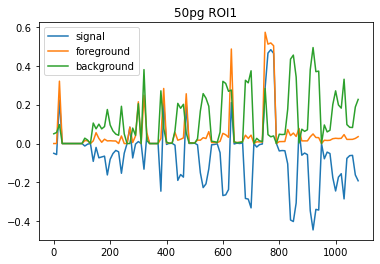

In [11]:
#ROI 1 (OLD)
plt.figure()
time = np.arange(0, len(signal)*10,10)
plt.plot(time, results)
plt.legend(["signal", "foreground", "background"])
plt.title(title+" ROI1")
plt.show()

### SELECT ROI 2

In [12]:
## SELECT ROI
ROIs = select_ROI(ROI_PATH) 

Select the ROI. Press right button if you want to delete. The last 2 ROIs will be used as background. Press 'q' when you have finished. 
ROIs:
 [[3132 3420  200]
 [3552 3188  200]
 [3684 3396  200]
 [ 584 1936  200]
 [1076  884  200]
 [4928 1924  200]]


In [13]:
signal = [] #np.zeros(3)
foreground = []
background = []
capture_refresh_time = framerate  # TODO

mes = Measure(NAME_IMG_FOLDER, ROIs, capture_refresh_time)
results = []
for img in imgs_thresh:
    print(img)
    result = mes.signal_perImage(img)
    results.append(result)
    signal.append(result[0])
    foreground = result[1]
    background = result[2]
    print('final signal', signal)
 
    

[[  0   0   0 ...   0   0   0]
 [  0   0   0 ... 255 255   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]
Percentage of pixels detected in each ROI (0-1) [0.012045315224227563, 0.000509517630106123, 0.002260984483595921, 0.0006767031024846945, 0.0569943236551521, 0.0003900994355500004]
Percentage of pixels corresponding to Background (0-1) 0.02869221154535105
Percentage of pixels corresponding to Foreground (0-1) 0.0038731301101035754
Percentage of pixels corresponding to Signal -0.024819081435247477
final signal [-0.024819081435247477]
[[  0   0   0 ... 255   0   0]
 [  0   0   0 ...   0 255   0]
 [  0   0   0 ... 255 255   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


C:\Users\Administrator\Documents\SENSUS\CODE\SensUs_2021_Code\analysis\Analyse_results_with_connected_components.py:73: FutureWarning: `draw.circle` is deprecated in favor of `draw.disk`.`draw.circle` will be removed in version 0.19
  xvec, yvec = circle(cx, cy, rad)  #TODO: change to disk


Percentage of pixels detected in each ROI (0-1) [0.013995812401977566, 0.00042194428743163307, 0.0013693286309102055, 0.0, 0.05619820235811128, 7.961212970408171e-05]
Percentage of pixels corresponding to Background (0-1) 0.02813890724390768
Percentage of pixels corresponding to Foreground (0-1) 0.0039467713300798506
Percentage of pixels corresponding to Signal -0.02419213591382783
final signal [-0.024819081435247477, -0.02419213591382783]
[[  0   0   0 ... 255 255 255]
 [  0   0   0 ... 255 255 255]
 [  0   0   0 ... 255 255 255]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]
Percentage of pixels detected in each ROI (0-1) [0.4661529030563097, 0.38857884387265246, 0.3720434045331147, 0.6427007618880812, 0.4674903868353382, 0.17067248365961038]
Percentage of pixels corresponding to Background (0-1) 0.3190814352474743
Percentage of pixels corresponding to Foreground (0-1) 0.46736897833753954
Percentage of pixels corresponding to Signal

Percentage of pixels detected in each ROI (0-1) [0.14976633839931852, 0.2906877691885136, 0.009370347666170419, 0.047536402646307194, 0.4987222253182495, 0.05611062901543679]
Percentage of pixels corresponding to Background (0-1) 0.27741642716684317
Percentage of pixels corresponding to Foreground (0-1) 0.12434021447507743
Percentage of pixels corresponding to Signal -0.15307621269176575
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575]
[[  0   0 255 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
Percentage of pixels detected in each ROI (0-1) [0.0, 0.0, 0.0, 0.0, 0.5391890708468342, 0.021917219307533695]
Percentage of pixels corresponding to Background (0-1) 0.28055314507718393
Percentage of pi

Percentage of pixels detected in each ROI (0-1) [0.0, 0.012873281373150013, 0.0008836946397153071, 0.0, 0.0, 0.1712616134194206]
Percentage of pixels corresponding to Background (0-1) 0.0856308067097103
Percentage of pixels corresponding to Foreground (0-1) 0.00343924400321633
Percentage of pixels corresponding to Signal -0.08219156270649397
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397]
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
Percentage of pixels detected 

Percentage of pixels detected in each ROI (0-1) [0.08152282081697967, 0.0, 0.0, 0.0, 0.0, 0.0]
Percentage of pixels corresponding to Background (0-1) 0.0
Percentage of pixels corresponding to Foreground (0-1) 0.02038070520424492
Percentage of pixels corresponding to Signal 0.02038070520424492
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492]
[[  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [255 255 255 ...   0   0   

Percentage of pixels detected in each ROI (0-1) [0.07448510855113885, 0.0, 0.0016957383626969404, 0.14901002316712975, 0.5614486223120955, 0.017849039479655122]
Percentage of pixels corresponding to Background (0-1) 0.2896488308958753
Percentage of pixels corresponding to Foreground (0-1) 0.05629771752024139
Percentage of pixels corresponding to Signal -0.2333511133756339
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33902626404158936, -0.0160119895

Percentage of pixels corresponding to Foreground (0-1) 0.010214236241033684
Percentage of pixels corresponding to Signal 0.008060728132538273
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33902626404158936, -0.016011989586733416, 0.002057973552850512, 0.0013116098368747462, 0.0028501142434061255, -0.2333511133756339, -0.20670294326043517, -0.15907100605848307, -0.1938714582553798, 0.11460962192199603, 0.007340238358716333, 0.008060728132538273]
[[25

Percentage of pixels detected in each ROI (0-1) [0.20307462044917163, 0.4868679792053117, 0.27257600968083495, 0.012546871641363278, 0.25587338486891864, 0.3810554976156167]
Percentage of pixels corresponding to Background (0-1) 0.3184644412422677
Percentage of pixels corresponding to Foreground (0-1) 0.2437663702441704
Percentage of pixels corresponding to Signal -0.0746980709980973
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33902626404158936, -

Percentage of pixels detected in each ROI (0-1) [0.061237650168379655, 0.004466240476398984, 7.961212970408171e-05, 0.04334880462387249, 0.3307565540685779, 0.36747366828810035]
Percentage of pixels corresponding to Background (0-1) 0.34911511117833915
Percentage of pixels corresponding to Foreground (0-1) 0.027283076849588805
Percentage of pixels corresponding to Signal -0.32183203432875035
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.339026264041

Percentage of pixels detected in each ROI (0-1) [0.013804743290687769, 0.0007881600840704089, 0.0031287566973704113, 0.008024902674171436, 0.007308393506834702, 0.006520233422764293]
Percentage of pixels corresponding to Background (0-1) 0.0069143134647994976
Percentage of pixels corresponding to Foreground (0-1) 0.006436640686575006
Percentage of pixels corresponding to Signal -0.00047767277822449196
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33

Percentage of pixels detected in each ROI (0-1) [0.0232865479384439, 0.009975399851921439, 0.010548607185790827, 0.007260626229012252, 0.004187598022434698, 0.014027657253859198]
Percentage of pixels corresponding to Background (0-1) 0.009107627638146949
Percentage of pixels corresponding to Foreground (0-1) 0.012767795301292106
Percentage of pixels corresponding to Signal 0.0036601676631451575
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.339026264

Percentage of pixels detected in each ROI (0-1) [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Percentage of pixels corresponding to Background (0-1) 0.0
Percentage of pixels corresponding to Foreground (0-1) 0.0
Percentage of pixels corresponding to Signal 0.0
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33902626404158936, -0.016011989586733416, 0.002057973552850512, 0.0013116098368747462, 0.0028501142434061255, -0.2333511133756339, -0.20670294326043517, -0.15907

Percentage of pixels detected in each ROI (0-1) [0.013788820864746953, 0.007013828626929599, 0.010835210852725522, 0.18285313950433488, 0.32951460484519424, 0.04719407048857964]
Percentage of pixels corresponding to Background (0-1) 0.18835433766688695
Percentage of pixels corresponding to Foreground (0-1) 0.05362274996218424
Percentage of pixels corresponding to Signal -0.1347315877047027
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33902626404158

Percentage of pixels detected in each ROI (0-1) [0.14951954079723587, 0.17512280171006855, 0.41109315415296677, 0.4394032274757382, 0.00037417700960918406, 0.002706812409938778]
Percentage of pixels corresponding to Background (0-1) 0.001540494709773981
Percentage of pixels corresponding to Foreground (0-1) 0.29378468103400235
Percentage of pixels corresponding to Signal 0.2922441863242284
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33902626404158

Percentage of pixels detected in each ROI (0-1) [0.03987771576877453, 0.007889562053674498, 0.020579735528505123, 0.07518569529253477, 0.19857653512089102, 0.24913819869595333]
Percentage of pixels corresponding to Background (0-1) 0.22385736690842217
Percentage of pixels corresponding to Foreground (0-1) 0.035883177160872234
Percentage of pixels corresponding to Signal -0.18797418974754992
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.3390262640415

[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
Percentage of pixels detected in each ROI (0-1) [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Percentage of pixels corresponding to Background (0-1) 0.0
Percentage of pixels corresponding to Foreground (0-1) 0.0
Percentage of pixels corresponding to Signal 0.0
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.0

Percentage of pixels detected in each ROI (0-1) [0.04791057965591638, 0.02421004864301125, 0.026574528895222476, 0.04099228558463167, 0.11157639978027052, 0.18601374105358692]
Percentage of pixels corresponding to Background (0-1) 0.14879507041692872
Percentage of pixels corresponding to Foreground (0-1) 0.034921860694695446
Percentage of pixels corresponding to Signal -0.11387320972223328
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.33902626404158

Percentage of pixels detected in each ROI (0-1) [0.04953466710187964, 0.020133907602162264, 0.024926557810347985, 0.028095120572570437, 0.02585801972788574, 0.07977135396348987]
Percentage of pixels corresponding to Background (0-1) 0.05281468684568781
Percentage of pixels corresponding to Foreground (0-1) 0.030672563271740082
Percentage of pixels corresponding to Signal -0.02214212357394773
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.339026264041

Percentage of pixels detected in each ROI (0-1) [0.043508028883280654, 0.024146358939247985, 0.03470292733800922, 0.0572888885350572, 0.09113996608523274, 0.1626236973465277]
Percentage of pixels corresponding to Background (0-1) 0.12688183171588022
Percentage of pixels corresponding to Foreground (0-1) 0.03991155092389877
Percentage of pixels corresponding to Signal -0.08697028079198145
final signal [-0.024819081435247477, -0.02419213591382783, 0.14828754309006525, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.06540534515838833, -0.023123343072550533, 0.0, -0.020476239759889818, -0.15307621269176575, -0.28055314507718393, -0.08571439944589958, -0.12471638178792921, -0.02693875438861865, -0.04063801160744851, -0.04337666886926893, -0.038739262314006165, 0.09156589097914958, -0.0889566034280983, -0.08219156270649397, 0.0, 0.06875104490920236, 0.0102301586669745, 0.0, 0.052898279581877095, 0.0, -0.2743115541083839, -0.0445191029305225, 0.0, 0.02038070520424492, 0.0, 0.0, -0.3390262640415893

In [14]:
import pandas as pd
R = pd.DataFrame(results, columns=["Signal", "Foreground", "Background"])
print(R)
ROI2 = "_ROI_2"
R.to_csv('Results_'+ title + ROI2 + '.csv', sep=';')

       Signal  Foreground  Background
0   -0.024819    0.003873    0.028692
1   -0.024192    0.003947    0.028139
2    0.148288    0.467369    0.319081
3    0.000000    0.000000    0.000000
4    0.000000    0.000000    0.000000
..        ...         ...         ...
104 -0.022142    0.030673    0.052815
105 -0.016179    0.031672    0.047851
106 -0.011466    0.031628    0.043094
107 -0.066731    0.032828    0.099559
108 -0.086970    0.039912    0.126882

[109 rows x 3 columns]


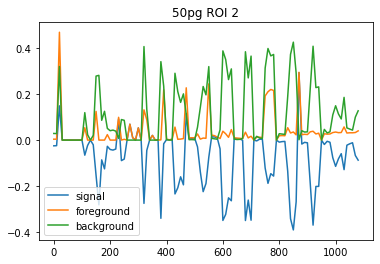

In [15]:
#ROI 2
plt.figure()
time = np.arange(0, len(signal)*10,10)
plt.plot(time, results)
plt.legend(["signal", "foreground", "background"])
plt.title(title+" ROI 2")
plt.show()